

---

## Topic 1: Introduction to AdaGrad & The Problem It Solves (Sparse Features / Long Valley)

### 1. Introduction

**What is AdaGrad?**  
AdaGrad (Adaptive Gradient) is an optimization algorithm used in deep learning. Its full name tells you what it does: it **adapts the learning rate** for each parameter individually.

**Why is it important?**  
Standard optimizers like Gradient Descent, Momentum, or NAG use the **same learning rate** for all parameters. AdaGrad is different – it gives **different learning rates to different parameters**. This is especially useful when your data has certain characteristics that confuse normal optimizers.(especially sparse column/feature)

**Real‑life use:**  
- When input features have very **different scales** (e.g., one column is CGPA from 0–10, another column is salary from 0–20,00,000).  
- When you have **sparse features** – meaning most values in a column are zero (e.g., a column that says “graduated from IIT” – most people are 0, few are 1).

---

### 2. Detailed Explanation

#### The Problem: Long Valley (Elongated Contours)

Imagine plotting the loss function against two parameters.  
- If your input features are **normal** (similar scales), the contour plot looks like **circles** – easy to optimize.  
- If your features have very different scales or one feature is sparse, the contour plot becomes **elongated** – like a long valley.
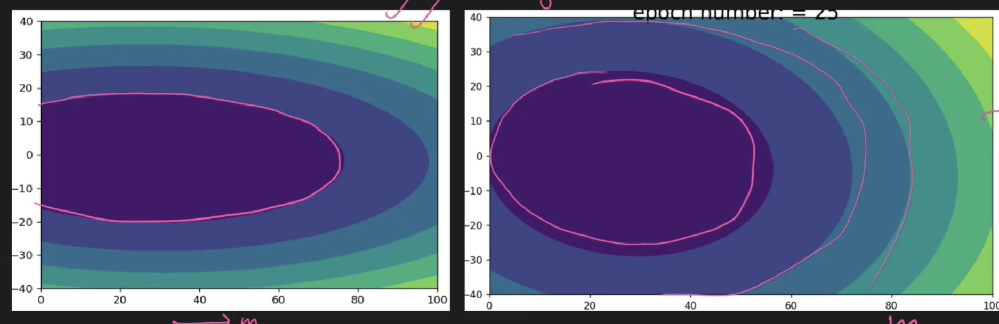
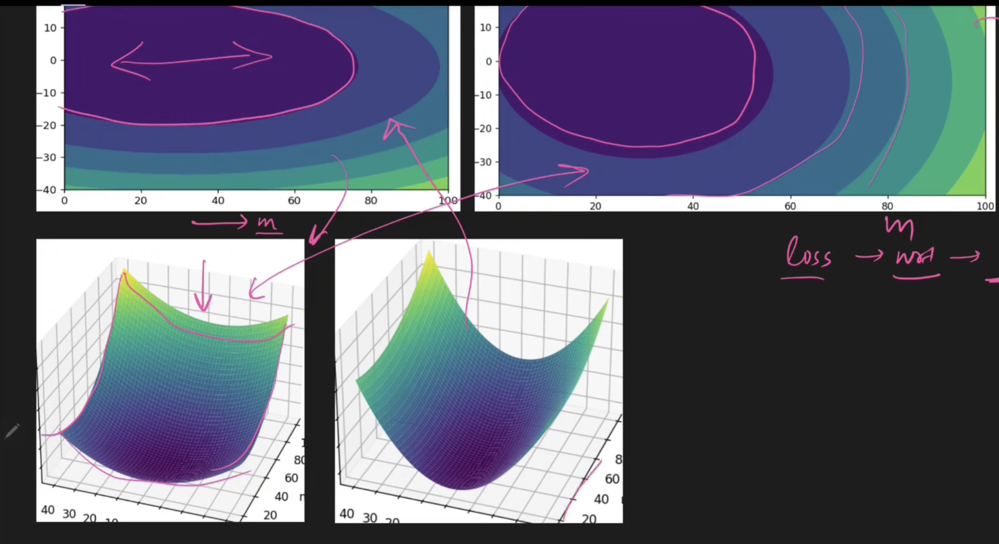
In this elongated valley:  
- On one axis (corresponding to the sparse / large‑scale feature), the loss changes **slowly** – gradients are small.  
- On the other axis (normal feature), the loss changes **quickly** – gradients are large.


#### Why do normal optimizers fail here?

**Standard Gradient Descent / SGD:**  
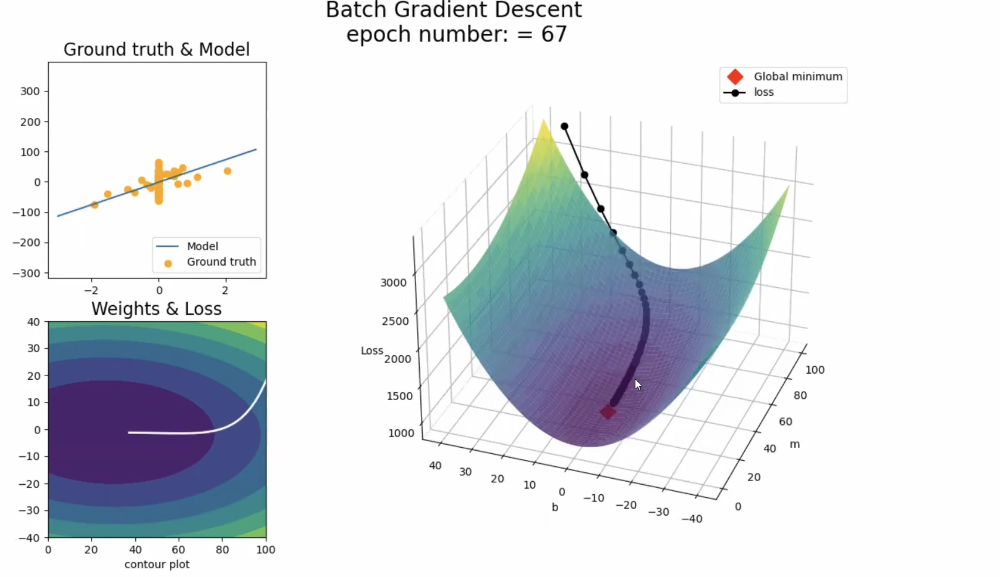
- In the long valley, moves very slowly along the “flat” direction and may zigzag.  
- If one feature is sparse (mostly zeros), its gradient is often **zero**, so the corresponding weight gets **very small updates** (or none).  
- The other weight updates normally, causing uneven movement.

**Momentum:**  
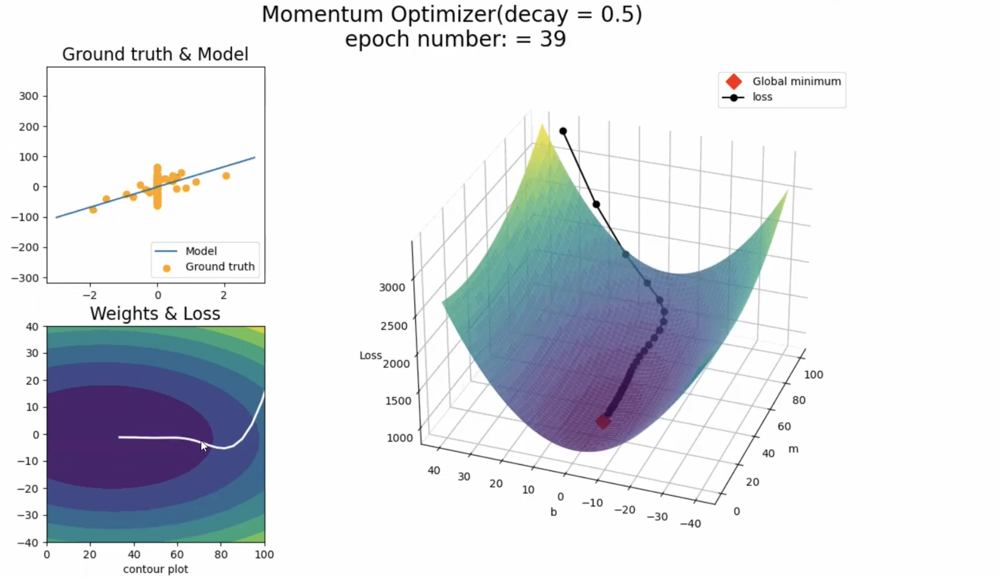
- Over‑shoots and then corrects, but still struggles to go straight down the valley efficiently.  
- Does not solve the root cause – different gradients for different parameters.
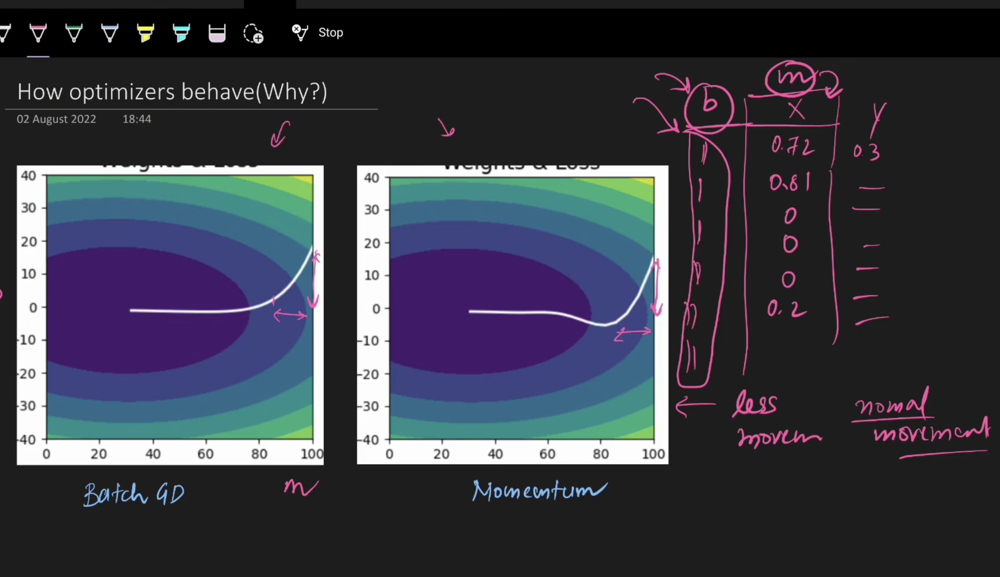
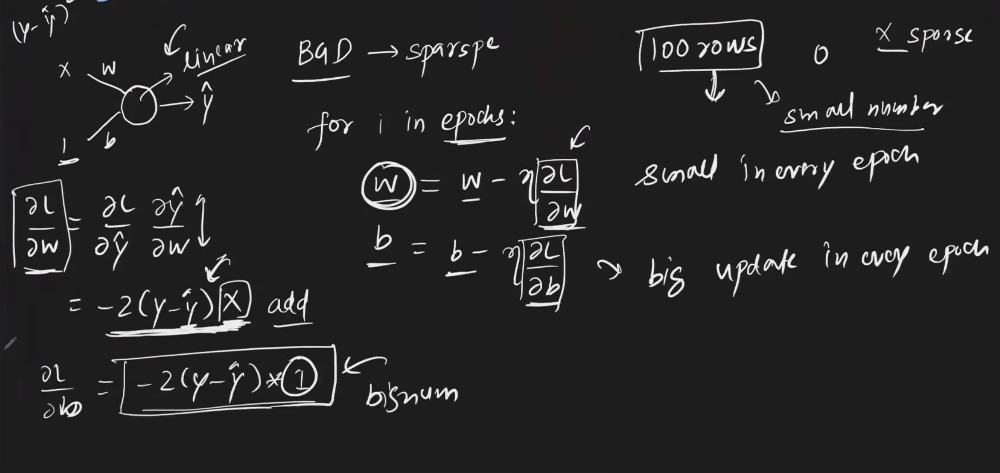
#### The Key Insight of AdaGrad

**The core idea:**  
For parameters that have **large gradients** (update a lot), we want a **small learning rate** so we don’t overshoot.  
For parameters that have **small gradients** (update very little), we want a **large learning rate** so they can catch up.

> **In short:** AdaGrad adapts the learning rate **per parameter** based on the **history of past gradients** for that parameter.

---

### 3. Key Points

| Concept | Explanation |
|---------|-------------|
| Full name | Adaptive Gradient |
| Main innovation | Different learning rates for different parameters |
| Problem solved | Long valley / elongated contours caused by sparse features or different feature scales |
| What it tracks | Sum of squares of past gradients for each parameter |
| Effect | Large past gradient → smaller learning rate; small past gradient → larger learning rate |

**When AdaGrad works well (according to the transcript):**
1. Input features have very different scales.
2. You have **sparse features** (mostly zeros, few ones).

**When it has problems:**
- Complex neural networks (the disadvantage will be covered in a later topic).

---

### 7. Common Mistakes

| Mistake | Why it’s wrong | How to avoid |
|---------|----------------|---------------|
| Thinking AdaGrad uses the same learning rate for all parameters | The whole point is per‑parameter adaptation | Remember: learning rate varies depending on the parameter’s gradient history |
| Believing AdaGrad always beats SGD/Momentum | It has a major disadvantage in deep networks (learning rate decays too much) | Use AdaGrad for sparse data / linear models, not automatically for every problem |

---

### 8. Interview / Exam Questions

**Q1: What does “adaptive” mean in AdaGrad?**  
*A:* It means the learning rate is adjusted individually for each parameter based on the history of its past gradients.

**Q2: What type of data problem does AdaGrad solve best?**  
*A:* Data with sparse features (many zeros) or features with very different scales.

**Q3: Why does SGD struggle in a “long valley”?**  
*A:* Because gradients are very small in one direction (flat axis) and large in the other, causing uneven, slow movement.

**Q4: How does AdaGrad decide to make a learning rate smaller for a given parameter?**  
*A:* If that parameter has had large gradients in the past, the accumulated sum of squares is large → dividing by a larger number → smaller effective learning rate.

---

### 9. Revision Notes

- **AdaGrad** = Adaptive Gradient.  
- Solves **long valley problem** caused by **sparse features** or different feature scales.  
- Keeps a **running sum of squared past gradients** for each parameter.  
- **Learning rate decreases** for parameters with large past gradients.  
- **Learning rate increases** (relatively) for parameters with small past gradients.  
- Works well for sparse data, but has a major disadvantage in deep neural networks (to be covered next).

---

**That concludes Topic 1.**  


## Topic 2: The Mathematical Formula of AdaGrad (Step by Step)

### 1. Introduction

Now that you understand *why* AdaGrad needs different learning rates for different parameters, let's look at **how** it actually does this mathematically.

The formula is the "engine" of AdaGrad. Don't be intimidated – we will break it down piece by piece, compare it to normal Gradient Descent, and explain what each symbol means.

**Why this matters:** Understanding the formula helps you see exactly why large past gradients lead to smaller learning rates, and vice versa.

---

### 2. Detailed Explanation

#### Step 1: Recall Normal Gradient Descent (SGD)

First, let's remember the standard update rule:

> **Wₜ₊₁ = Wₜ − learning_rate × gradient**

Where:
- **Wₜ** = current weight/parameter value
- **Wₜ₊₁** = updated weight
- **learning_rate** = a fixed number (e.g., 0.01)
- **gradient** = how much the loss changes with respect to W

**Problem:** The same learning_rate is used for EVERY parameter.

---

#### Step 2: AdaGrad's Modified Formula

According to the transcript, AdaGrad's update looks like this:
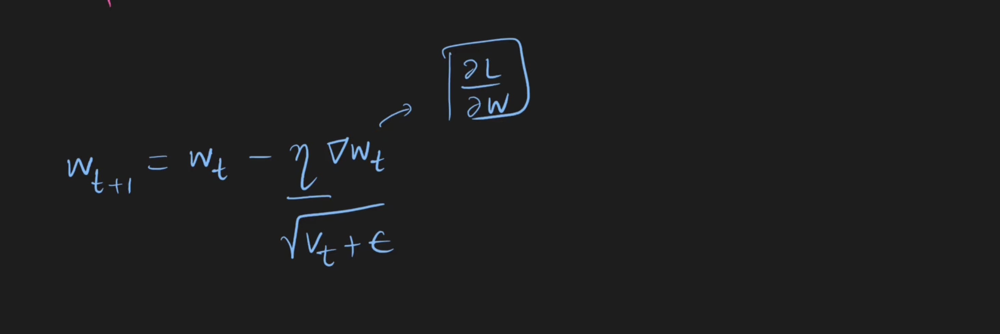
> **Wₜ₊₁ = Wₜ − (learning_rate / √(Vₜ + ε)) × gradient**

Or written another way:

> **Wₜ₊₁ = Wₜ − learning_rate × (gradient / √(Vₜ + ε))**

Where **Vₜ** is a running sum of **squared past gradients**.

---

#### Step 3: Understanding Vₜ (The "Accumulator")

**Vₜ is updated at each step:**

> **Vₜ = Vₜ₋₁ + (gradient at current step)²**

Let's trace this with an example:
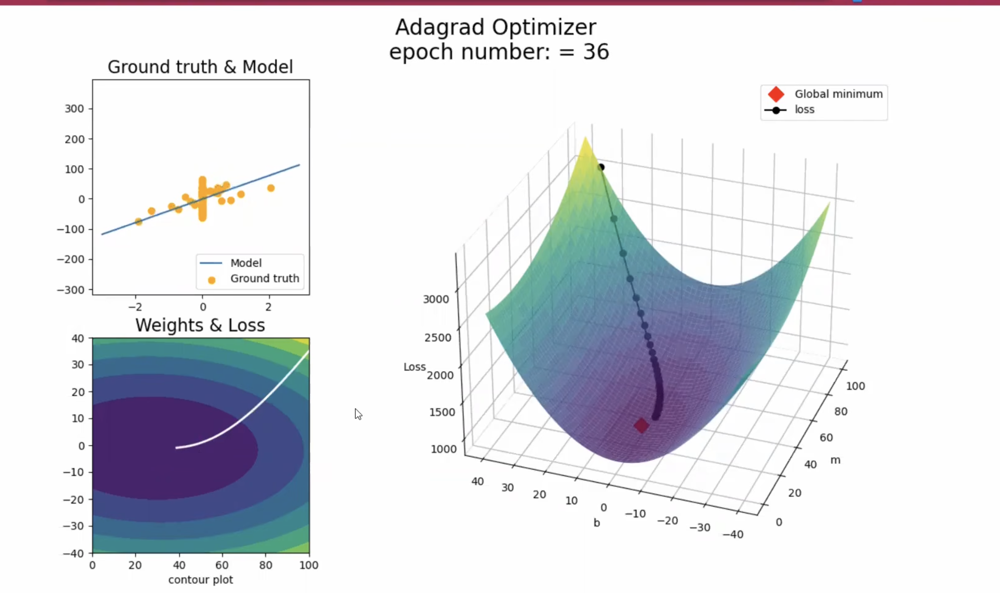

| Step | Gradient Value | Gradient² | Vₜ (running sum) |
|------|----------------|-----------|------------------|
| Start | – | – | V₀ = 0 |
| Step 1 | 3 | 9 | V₁ = 0 + 9 = 9 |
| Step 2 | 2 | 4 | V₂ = 9 + 4 = 13 |
| Step 3 | 5 | 25 | V₃ = 13 + 25 = 38 |
| Step 4 | 1 | 1 | V₄ = 38 + 1 = 39 |

**Key point:** Vₜ only grows. It never shrinks. It accumulates all past squared gradients.

**Why square the gradient?**  
Because gradients can be negative or positive. Squaring makes everything positive so we only care about **magnitude**, not direction.

---

#### Step 4: Understanding ε (Epsilon)

**ε (epsilon)** is a very small number (e.g., 0.00001).

**Why is it there?**  
If Vₜ becomes zero (at the very first step), then √(0) = 0, and dividing by zero would be impossible (infinite). ε ensures we never divide by zero.

> **Think of ε as a "safety mat"** – it doesn't change the result significantly, but prevents crashes.

---

#### Step 5: Putting It All Together – Why Learning Rate Varies Per Parameter

Let's compare two parameters:

**Parameter A (large past gradients):**
- Suppose Vₜ = 100
- √(Vₜ + ε) ≈ √100 = 10
- Effective learning rate = original_lr / 10 = **smaller**

**Parameter B (small past gradients):**
- Suppose Vₜ = 1
- √(Vₜ + ε) ≈ √1 = 1
- Effective learning rate = original_lr / 1 = **unchanged (larger relative to A)**

| Parameter | Past Gradients | Vₜ | √Vₜ | Effective LR |
|-----------|----------------|----|-----|---------------|
| A (sparse feature) | Small | 1 | 1 | Normal |
| B (dense feature) | Large | 100 | 10 | Very small |

**Wait – this seems opposite!** Let me check the transcript carefully.

The transcript says: *"If someone's gradient is bigger, then you will divide by a bigger number, so the learning rate becomes smaller."*

Yes – so **parameters that have had large updates get their learning rate reduced**. Parameters that have been "quiet" (small gradients) keep a larger learning rate.

This balances the movement so that **both parameters make progress at a similar pace**.

---

### 3. Key Points

| Component | What it is | Purpose |
|-----------|-----------|---------|
| Wₜ | Current weight value | What we are updating |
| learning_rate | Base learning rate (fixed) | Starting point before adaptation |
| gradient | Current gradient | Direction and magnitude of change |
| Vₜ | Sum of squared past gradients | "Memory" of how much this parameter has moved |
| ε | Tiny constant (e.g., 1e-8) | Prevent division by zero |
| √(Vₜ + ε) | Square root of accumulator | Scaling factor for learning rate |

**The intuition in one sentence:**  
Divide the learning rate by the **root of past squared gradients** – so parameters that have moved a lot in the past get smaller steps now.

---

### 4. Syntax / Structure (Formula Breakdown)

Let me break down the update rule line by line:

**Line 1 (Accumulation):**
> Vₜ = Vₜ₋₁ + (gₜ)²

- **gₜ** = gradient at time step t
- **(gₜ)²** = square of the gradient
- We add this to **all previous squared gradients** (Vₜ₋₁)

**Line 2 (Update):**
> Wₜ₊₁ = Wₜ − (η / √(Vₜ + ε)) × gₜ

- **η** (eta) = base learning rate
- **√(Vₜ + ε)** = square root of accumulated squares
- We divide η by this square root, then multiply by gₜ
- Subtract from current weight Wₜ

---

### 5. Code Examples (from transcript concepts)

The transcript mentions pseudo‑code for batch gradient descent. Here is how AdaGrad would look in Python‑style logic:

#### Simple Example – Two Parameters

```python
# Initialization
w1 = 0.0      # weight for sparse feature
w2 = 0.0      # weight for dense feature
lr = 0.1      # base learning rate
epsilon = 1e-8
v1 = 0.0      # accumulator for w1
v2 = 0.0      # accumulator for w2

# At each training step (for each parameter separately)
# For parameter w1 (sparse feature - often zero gradient)
gradient_w1 = 0.01  # small gradient because feature is often zero
v1 = v1 + (gradient_w1 ** 2)  # v1 grows slowly
effective_lr_w1 = lr / ((v1 + epsilon) ** 0.5)
w1 = w1 - effective_lr_w1 * gradient_w1

# For parameter w2 (dense feature - large gradient)
gradient_w2 = 5.0   # large gradient
v2 = v2 + (gradient_w2 ** 2)  # v2 grows quickly (25, then 50, etc.)
effective_lr_w2 = lr / ((v2 + epsilon) ** 0.5)
w2 = w2 - effective_lr_w2 * gradient_w2
```

**Explanation of the code:**
- `v1` stays small because `gradient_w1` is small → `effective_lr_w1` remains relatively large.
- `v2` becomes large quickly because `gradient_w2` is large → `effective_lr_w2` becomes very small.
- Result: Both parameters make progress at a similar effective rate.

---

### 7. Common Mistakes

| Mistake | Correct Understanding |
|---------|----------------------|
| Thinking Vₜ resets each epoch | No – Vₜ accumulates **forever** (sum of all past squared gradients) |
| Forgetting to square the gradient | Squaring removes sign (positive/negative) so only magnitude matters |
| Using ε = 0 | Can cause division by zero when Vₜ = 0 |
| Believing learning rate increases | Learning rate only stays same or decreases (Vₜ only grows) |

---

### 8. Interview / Exam Questions

**Q1: Write the AdaGrad weight update formula.**  
*A:* Wₜ₊₁ = Wₜ − (η / √(Vₜ + ε)) × gₜ, where Vₜ = Σ(gᵢ²) from i=1 to t.

**Q2: What happens to Vₜ over many training steps?**  
*A:* Vₜ grows continuously because we keep adding squared gradients. It never decreases.

**Q3: Why is the gradient squared before adding to Vₜ?**  
*A:* To make it always positive, because we only care about the magnitude of past updates, not the direction (positive or negative).

**Q4: What is the purpose of ε in the formula?**  
*A:* To prevent division by zero when Vₜ is zero (at the first step).

**Q5: If a parameter has consistently large gradients, how does its effective learning rate change over time?**  
*A:* It decreases (becomes smaller) because Vₜ becomes large, making the division factor √(Vₜ) larger.

---

### 9. Revision Notes

- **Formula:** Wₜ₊₁ = Wₜ − (lr / √(Vₜ + ε)) × gₜ
- **Vₜ** = running sum of **squared** past gradients: Vₜ = Vₜ₋₁ + gₜ²
- **ε** = tiny constant to avoid division by zero
- **Effect:** Large past gradient → large Vₜ → small effective learning rate
- **Effect:** Small past gradient → small Vₜ → large effective learning rate
- **Vₜ never shrinks** – it only accumulates

---

**That concludes Topic 2.**  


## Topic 3: The Major Disadvantage of AdaGrad (Why It Fails in Deep Neural Networks)

### 1. Introduction

AdaGrad sounds great – it adapts learning rates per parameter and handles sparse features well. So why isn't it used everywhere?

According to the transcript, AdaGrad has a **very big disadvantage** that makes it unsuitable for complex neural networks. In fact, the transcript states:

> *"There is such a huge disadvantage that due to that, you don't use AdaGrad in neural networks."*

Instead, AdaGrad is better suited for simpler models like **linear regression**, not deep learning problems.

**Real‑life use (corrected):**  
- ✅ Good for: Linear regression, simple models with sparse data
- ❌ Bad for: Complex neural networks with many layers

---

### 2. Detailed Explanation

#### The Problem: Learning Rate Keeps Shrinking
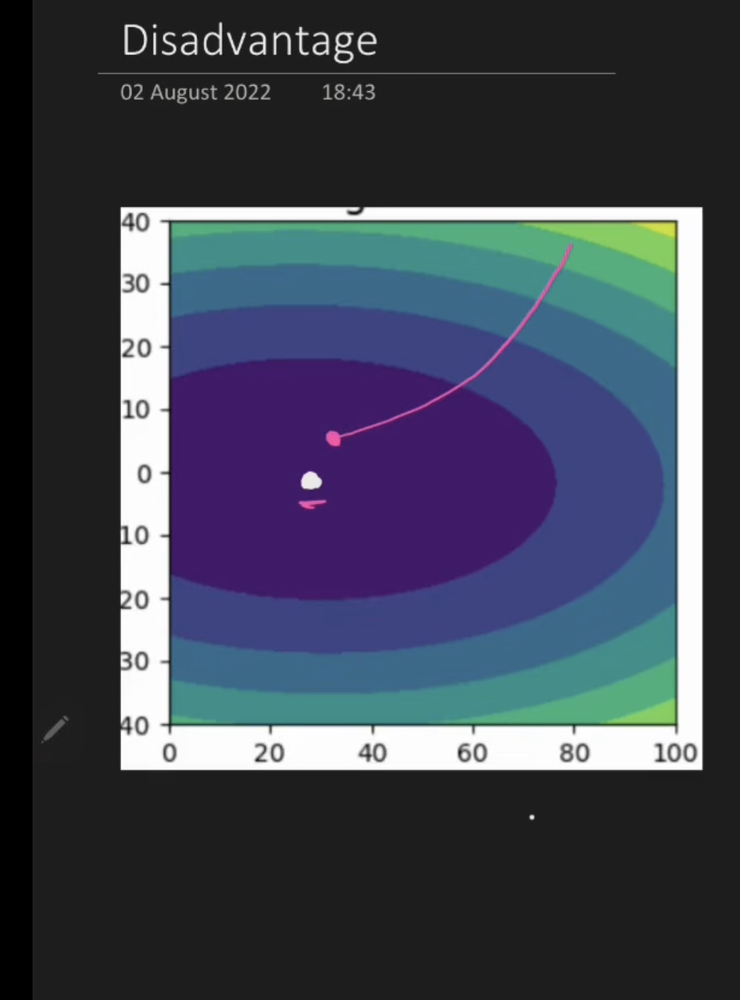
Remember the AdaGrad formula:

> **Wₜ₊₁ = Wₜ − (learning_rate / √(Vₜ + ε)) × gradient**

And remember that **Vₜ accumulates all past squared gradients**:

> **Vₜ = Vₜ₋₁ + (gradient)²**

**Vₜ never decreases – it only grows** (or stays the same).

#### What happens over time?

| Training Step | Vₜ (accumulator) | √Vₜ | Effective Learning Rate |
|---------------|------------------|-----|------------------------|
| Step 1 | 0 + small = small | small | almost original LR |
| Step 100 | large | large | very small |
| Step 10,000 | huge | huge | tiny |
| Step 100,000 | enormous | enormous | practically zero |

**The learning rate becomes so small that updates stop happening.**

The transcript describes this as:

> *"The learning rate starts getting smaller due to which the update becomes very small and basically there is no update. You get stuck at a place and until your minimum doesn't converge."*

---

#### Visualizing the Problem

Imagine you are trying to walk to the bottom of a valley (the minimum):

- **Early steps:** Your learning rate is normal. You make good progress.
- **Later steps:** Because Vₜ has grown large, your effective learning rate becomes tiny.
- **Result:** You are still far from the bottom, but you can only take microscopic steps. You will **never reach the true minimum**.

The transcript says:

> *"You can never reach the global minimum no matter how many steps you take."*

---

#### Why is this worse in deep neural networks?

Deep neural networks have:
- Many parameters (millions)
- Complex loss landscapes with many plateaus and saddle points
- Need to keep learning for many epochs

AdaGrad's shrinking learning rate causes it to **stop learning too early** – long before reaching a good solution.

| Model Type | AdaGrad Performance |
|------------|---------------------|
| Linear regression (simple, convex) | Acceptable |
| Shallow network | Poor |
| Deep neural network (many layers) | Very poor – stops updating too early |

---

### 3. Key Points

| Disadvantage | Explanation |
|--------------|-------------|
| **Vanishing learning rate** | Vₜ grows indefinitely → effective LR → 0 |
| **Never reaches minimum** | Updates become too small to make progress |
| **Cumulative problem** | Worse the longer you train |
| **Not suitable for deep networks** | Complex models need sustained learning |

**One‑sentence summary:**  
AdaGrad's accumulator grows forever, causing the learning rate to shrink to zero – so training stops before reaching the optimum.

---

### 7. Common Mistakes

| Mistake | Correct Understanding |
|---------|----------------------|
| Thinking you can fix AdaGrad by increasing the base learning rate | That just makes Vₜ grow even faster – the problem gets worse |
| Believing the learning rate will "recover" | No – Vₜ only increases, so LR never increases |
| Using AdaGrad for deep neural networks | The transcript explicitly warns against this – use RMSprop or Adam instead (coming next) |

---

### 8. Interview / Exam Questions

**Q1: What is the biggest disadvantage of AdaGrad?**  
*A:* The learning rate decays to zero over time because Vₜ (accumulator of squared gradients) grows continuously, eventually making updates too small to reach the global minimum.

**Q2: Why does this problem not occur as severely in linear regression?**  
*A:* Linear regression has simple, convex loss functions and often converges quickly – training stops before the learning rate becomes too small. Deep networks require many more steps.

**Q3: True or False – AdaGrad's learning rate can increase during training.**  
*A:* False. The effective learning rate can only stay the same or decrease (since Vₜ only grows or stays the same).

**Q4: If you train a deep neural network with AdaGrad for 10,000 epochs, what will likely happen?**  
*A:* After many epochs, the learning rate becomes extremely small and the weights effectively stop updating – the network will not reach a good optimum.

**Q5: What does the transcript say is the solution to this problem?**  
*A:* The transcript mentions that RMSprop and other optimizers were developed to fix this issue (to be covered in future videos).

---

### 9. Revision Notes

- **Major disadvantage:** Learning rate → 0 over time
- **Cause:** Vₜ grows forever (sum of squared gradients)
- **Consequence:** Training stops before reaching minimum
- **Use AdaGrad for:** Linear regression, sparse data, simple models
- **Do NOT use AdaGrad for:** Complex deep neural networks
- **Successors that fix this problem:** RMSprop, Adam (mentioned in transcript)

---

### Connection to Next Optimizers

The transcript ends by saying:

> *"This is the biggest problem of AdaGrad. That's why we will cover RMSprop and other optimizers next. In both of these, we will fix what AdaGrad does wrong."*

**Preview of the fix:**  
Instead of accumulating *all* past squared gradients (Vₜ), RMSprop uses a **moving average** – it "forgets" old gradients so the learning rate doesn't shrink forever.

---

**That concludes Topic 3 – and completes all major topics from the transcript.**  


